# SEIE Survey Data Analysis 

## Table of Contents<a id="1.1_Table_of_Contents"></a>
* [1 SEIE Survey Data Analysis](#1_SEIE_Survey_Data_Analysis)
    * [1.2 Load Data](#1.2_Load_Data)
    * [1.3 Explore Data](#1.3_Explore_Data)
    * [1.4 Basic Plots](#1.4_Basic_Plots)
    * [1.5 Word Cloud](#1.5_Word_Cloud)
    * [1.6 Count Vectorizer](#1.6_Count_Vectorizer)
    * [1.7 TF-IDF Vectorizer](#1.7_TF_-_IDF_Vectorizer)

In [1]:
# importing necessary modules for the start
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline

## Load Data<a id='1.2_Load_Data'></a>

In [2]:
data = pd.read_csv('./data/SEIEsurvey.csv')

In [3]:
data.head()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
0,7/12/2020 0:54:17,Latino/Hispano,Male,NaN,Arleta,5-7 Years,Our communities have a high level of social an...,Cut taxes and regulations to create more jobs,"Promote business ownership, Support small busi...",Increase availability of educational/cultural ...,Recreation & wellness programs,Support non profit youth programs,Create more policing in communities,Infrastructure investment (such as street & si...,"Jobs / Business / Economic Development, School...",NaN,"Reduce taxes and regulations, school choice, m...",Ensure everyone is equal under the law,NaN,NaN
1,7/6/2020 19:56:49,Latino/Hispano,Female,NaN,Arroyo Seco,0-1 Year,Our communities have a high level of social an...,"Address rent control and evictions, Address th...","Create and promote living wage jobs, Help for ...","Youth recreation & development (youth centers,...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Jobs / Business / Economic Developmen...",The housing situation in Los Angeles has racia...,Supported employment initiatives.\nScholarship...,Work with nonprofits leaders who have ties in ...,Ensuring that all programs go through communit...,NaN
2,7/7/2020 1:01:24,White/Caucasian,Male,NaN,Arroyo Seco,2-4 Years,Our communities have a moderate level economic...,"Address rent control and evictions, Address th...","Help for those seeking work, Support small bus...","Afterschool and/or child care programs, Increa...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,Develop & support alternatives to armed crisis...,Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",A community is only as strong as its care and ...,"Funding for mental health services, schools an...",By establishing practices and procedures that ...,It must be part and parcel of any process that...,NaN
3,7/6/2020 21:19:29,Latino/Hispano,Male,NaN,Atwater Village,2-4 Years,Our communities have a high level of social an...,"Add

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 20 columns):
 #   Column                                                                                                                                                                                                                                                                                                       Non-Null Count  Dtype 
---  ------                                                                                                                                                                                                                                                                                                       --------------  ----- 
 0   Timestamp                                                                                                                                                                                                                               

## Explore Data<a id='1.3_Explore_Data'></a>

In [5]:
data.shape

(696, 20)

In [6]:
data.describe()

,Timestamp,What ethnic group do you identify with? (Your response is optional),"Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?","If you chose ""Prefer to self-describe"" to the previous question, please do so here.",What Neighborhood Council are you from?,For how many years have you been a member of your NC Board?,Please select the option that best represents your point of view.,HOUSING,JOBS / BUSINESS / ECONOMIC DEVELOPMENT,"SCHOOLS, EDUCATION & ARTS / CULTURE",QUALITY OF LIFE,SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH,PUBLIC SAFETY & EMERGENCY PREPAREDNESS,INFRASTRUCTURE & SUSTAINABILITY,"Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.","Please explain why the categories you chose above are your top 3 areas of concern. Please also feel free to use this space to talk about other priorities you have for addressing racial, economic, or social inequities in the City of Los Angeles which did not appear on the list above:","What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?","How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",How might civic engagement be built into the development of City programs?,"Please share any other general comments, support or guidance that you might like to provide."
count,686,670,690,15,696,696,686,693,689,687,689,680,679,691,694,524,519,493,479,316
unique,683,37,7,15,98,7,7,167,199,153,272,110,169,110,126,497,493,466,449,297
top,7/7/2020 12:40:41,White/Caucasian,Male,"born a girl, and happy to be a girl.",West Hills,2-4 Years,Our communities have a high level of social an...,"Address rent control and evictions, Home owner...",Assistance with lending and financial institut...,"Address over-policing in schools, Youth recrea...","Address the ""digital divide"" (improve individu...",Increase access to mental health services & pr...,"Address over-policing in LA neighborhoods, Dev...",Infrastructure investment (such as street & si...,"Housing, Schools, Education & Arts / Culture, ...",Ultimately people's priority is safety and the...,"For schools, invest in providing equity and ac...",Language access and people who are good at com...,See above,The survey was a great start and hopefully the...
freq,2,343,337,1,20,248,299,156,100,164,103,195,155,214,62,4,4,4,5,4


In [7]:
data.columns

Index(['Timestamp',
       'What ethnic group do you identify with? (Your response is optional)',
       'Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?',
       'If you chose "Prefer to self-describe" to the previous question, please do so here.',
       'What Neighborhood Council are you from?',
       'For how many years have you been a member of your NC Board?',
       'Please select the option that best represents your point of view.',
       'HOUSING', 'JOBS / BUSINESS / ECONOMIC DEVELOPMENT',
       'SCHOOLS, EDUCATION & ARTS / CULTURE', 'QUALITY OF LIFE',
       'SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH',
       'PUBLIC SAFETY & EMERGENCY PREPAREDNESS',
       'INFRASTRUCTURE & SUSTAINABILITY',
       'Of the categories of possible City budget ini

In [8]:
missing = pd.concat([data.isnull().sum(), 100 * data.isnull().mean()], axis=1)
missing.columns = ['count','%']

In [9]:
# returns the top 5 questions that have the most null values, left blank
missing.sort_values(by='%', ascending=False).head()

,count,%
"If you chose ""Prefer to self-describe"" to the previous question, please do so here.",681,97.844828
"Please share any other general comments, support or guidance that you might like to provide.",380,54.597701
How might civic engagement be built into the development of City programs?,217,31.178161
"How can the City best ensure that these initiatives are developed and carried out in a way that is mindful of equality, diversity, and inclusion? For example, how might community voices have input in discussions with City departments and decision makers about inclusion, equity, and social justice?",203,29.166667
"What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action?",177,25.431034


**Avoiding redundancy from the responses**

In [10]:
data.loc[data.iloc[:,5] == "2-4 Años", data.iloc[:,5].name] ='2-4 Years'

In [11]:
data.loc[data.iloc[:,5] == '10 Años o más', data.iloc[:,5].name] ='10 years or more'

In [12]:
data.loc[data.iloc[:,2] == 'Mujer', data.iloc[:,2].name] ='Female'

In [13]:
data.loc[data.iloc[:,6] == '3', data.iloc[:,6].name] =np.nan

In [14]:
data.loc[data.iloc[:,6] == '5', data.iloc[:,6].name] =np.nan

## Basic Plots<a id='1.4_Basic_Plots'></a>

In [15]:
data.iloc[:,1].value_counts(normalize=True)

White/Caucasian                                                                          0.511940
Latino/Hispano                                                                           0.159701
Black/African American                                                                   0.135821
Asian/Pacific Islander                                                                   0.076119
Multiethnic                                                                              0.053731
Middle Eastern                                                                           0.004478
Jewish                                                                                   0.004478
Native American                                                                          0.004478
Persian                                                                                  0.002985
Arab American                                                                            0.002985
Irrelevant          

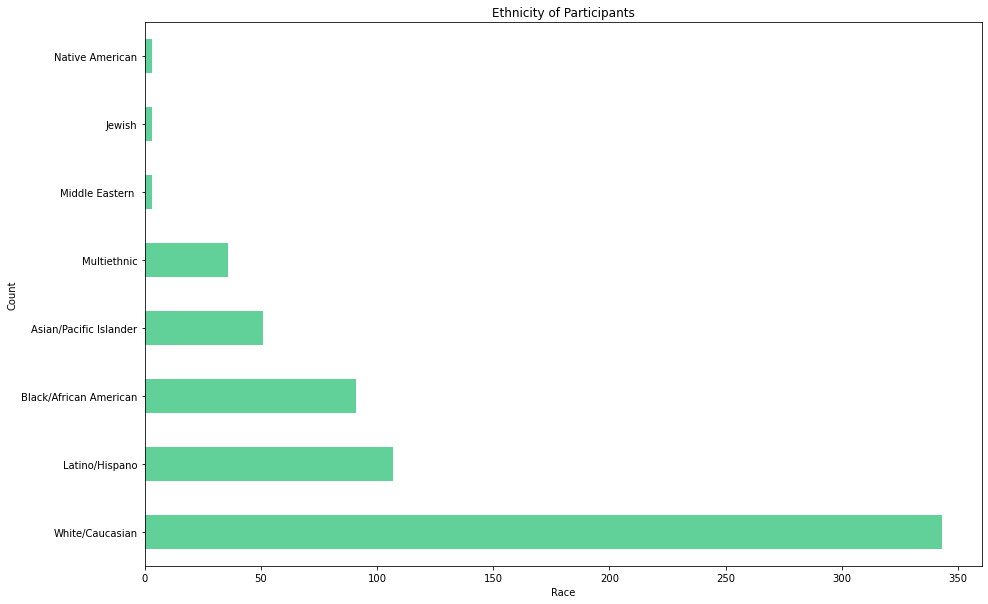

In [16]:
data.iloc[:,1].value_counts().head(8).plot(kind='barh', figsize=(15,10), color= '#61d199')
plt.title("Ethnicity of Participants")
plt.xlabel("Race")
plt.ylabel("Count")
plt.show()

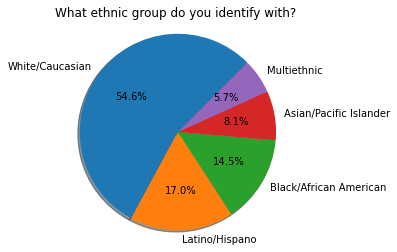

In [17]:
# pie plot 
data.iloc[:,1].value_counts().head().plot.pie(autopct='%1.1f%%', shadow=True, explode=None, startangle=45)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,1].name[0:40])
plt.show()

In [18]:
data.iloc[:,4].value_counts(normalize=True)

West Hills                   0.028736
Venice                       0.024425
Woodland Hills-Warner Ctr    0.022989
Los Feliz                    0.022989
Wilshire-Center Koreatown    0.022989
                               ...   
North Hills East             0.002874
Olympic Park                 0.002874
Watts                        0.002874
North Hollywood Northeast    0.002874
Studio City                  0.001437
Name: What Neighborhood Council are you from?, Length: 98, dtype: float64

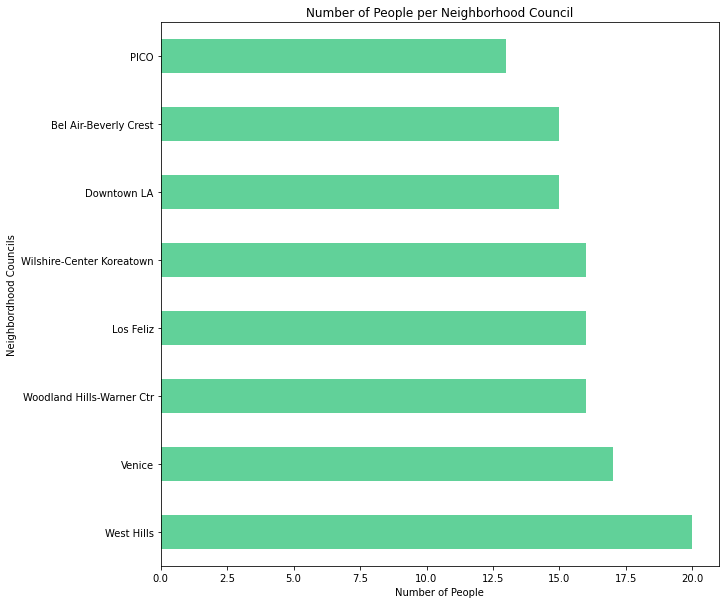

In [19]:
data.iloc[:,4].value_counts().head(8).plot(kind='barh', figsize=(10,10), color= '#61d199')
plt.title("Number of People per Neighborhood Council")
plt.xlabel("Number of People")
plt.ylabel("Neighbordhood Councils")
plt.show()

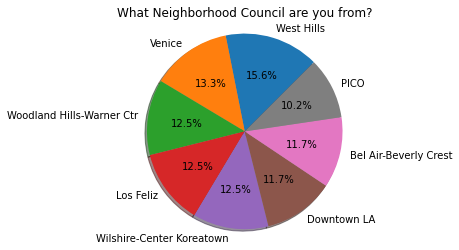

In [20]:
# pie plot 
data.iloc[:,4].value_counts().head(8).plot.pie(autopct='%1.1f%%', shadow=True, explode=None, startangle=45)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,4].name)
plt.show()

In [21]:
data.iloc[:,2].value_counts(normalize=True)

Male                                                0.488406
Female                                              0.462319
Prefer not to say                                   0.030435
Non-binary / Gender non-conforming / Genderfluid    0.008696
Trans                                               0.007246
Prefer to self-describe (please use space below)    0.002899
Name: Our Department does not discriminate on the basis of gender identity or expression. In order to track the effectiveness of our efforts and ensure we consider the needs of all residents of Los Angeles, please consider the following optional question: How do you gender identify?, dtype: float64

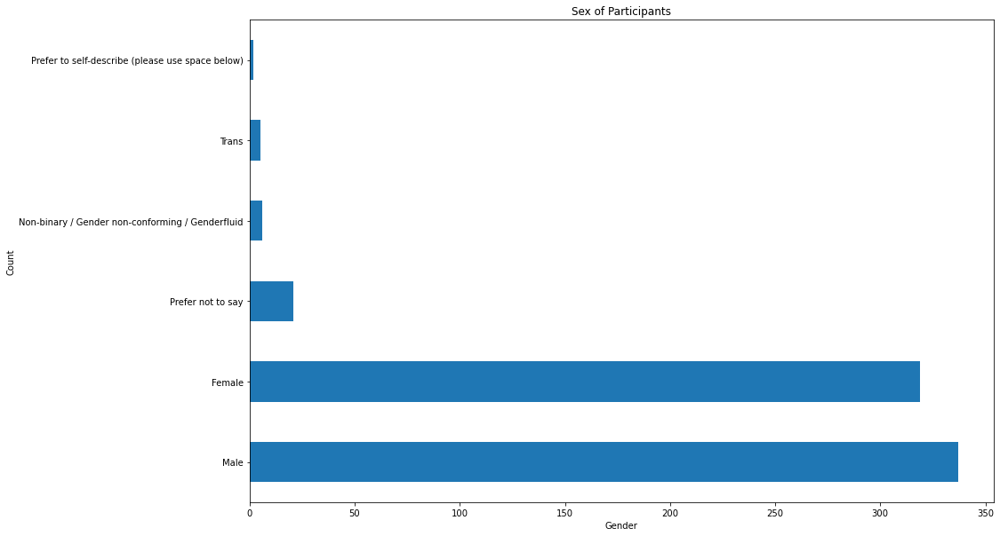

In [22]:
data.iloc[:,2].value_counts().plot(kind='barh', figsize=(15,10))
plt.title("Sex of Participants")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

In [23]:
data.iloc[:,5].value_counts(normalize=True)

2-4 Years           0.357759
0-1 Year            0.337644
5-7 Years           0.146552
10 years or more    0.097701
8-10 Years          0.060345
Name: For how many years have you been a member of your NC Board?, dtype: float64

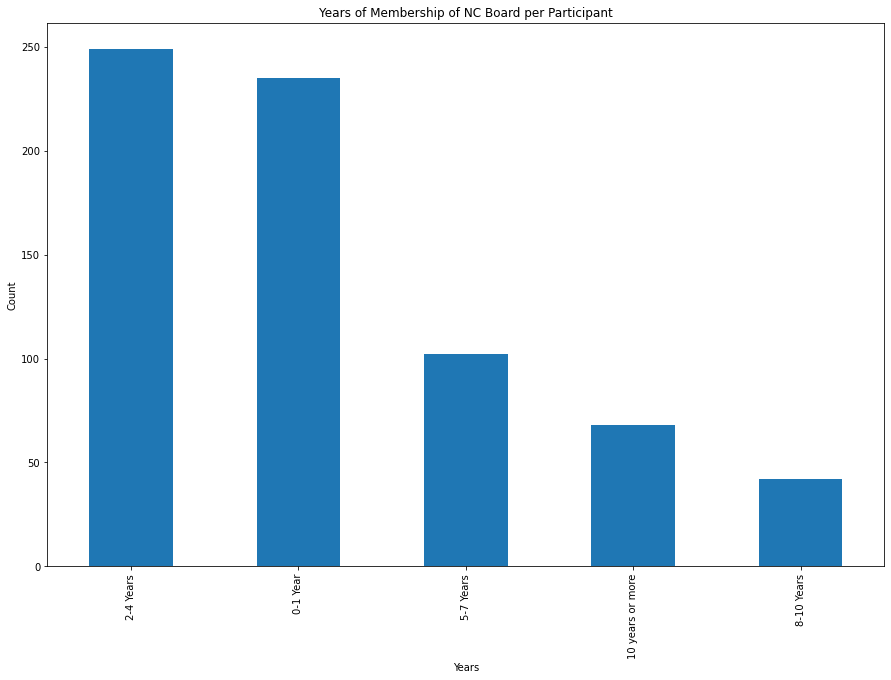

In [25]:
data.iloc[:,5].value_counts().plot(kind='bar', figsize=(15,10))
plt.title("Years of Membership of NC Board per Participant")
plt.xlabel("Years")
plt.ylabel("Count")
plt.show()

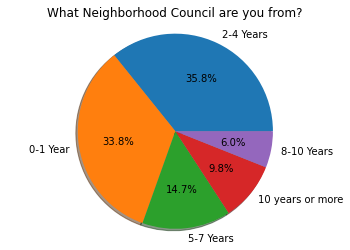

In [26]:
# pie plot 
data.iloc[:,5].value_counts().head(8).plot.pie(autopct='%1.1f%%', shadow=True, explode=None)
plt.ylabel('')
plt.axis('equal')
plt.title(data.iloc[:,4].name)
plt.show()

In [27]:
data.iloc[:,6].value_counts(normalize =True)

Our communities have a high level of social and economic disparity issues.                0.437775
Our communitites have experienced an increase in social and economic disparity issues.    0.234261
Our communities have a moderate level economic social or economic disparity issues.       0.210835
Our communities have a small level of social or economic disparity issues.                0.081991
Our communities have no social or economic disparity issues.                              0.035139
Name: Please select the option that best represents your point of view., dtype: float64

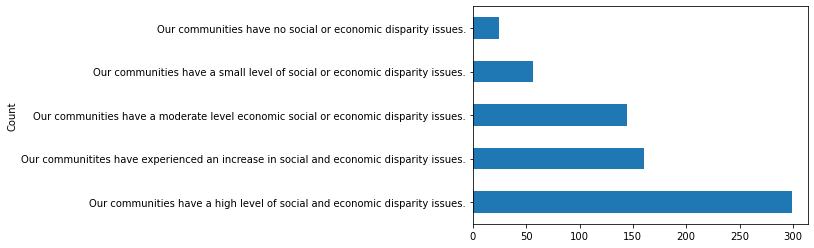

In [28]:
data.iloc[:,6].value_counts().plot(kind='barh')
plt.ylabel("Count")
plt.show()

In [29]:
df= data.fillna("")

In [30]:
df = df.apply(lambda x: x.astype(str).str.lower())

In [32]:
def wc(n):
    """
    parameter: range(1,20) 
    ignoring the first column because it is a timestamp
    returns the average number of words per response 
    """
    col = df.iloc[:,n]
    return col.str.split().apply(len).mean()

In [33]:
word_lengths = []
cols = []
for i in range(1,20):
    cols.append(i)
    word_lengths.append(wc(i))

In [34]:
wc = pd.DataFrame({'col#':cols, 'word-counts':word_lengths})

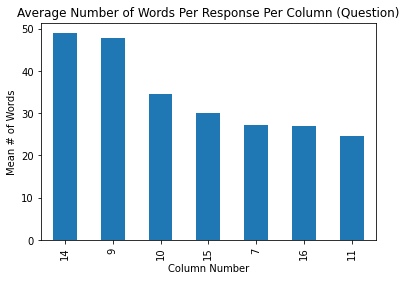

In [35]:
wc['word-counts'].sort_values(ascending=False).head(7).plot(kind='bar')
plt.title("Average Number of Words Per Response Per Column (Question)")
plt.xlabel('Column Number')
plt.ylabel("Mean # of Words")
plt.show()

## Word Cloud <a id="1.5_Word_Cloud"></a>

In [36]:
from wordcloud import WordCloud

def get_word_cloud(text):
    """
    parameter: text, doc, corpus
    returns: word cloud
    base case
    doesn't generate clouds based on weights
    """
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color="white").generate(str(text))
    fig = plt.figure(
        figsize= (40,30), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

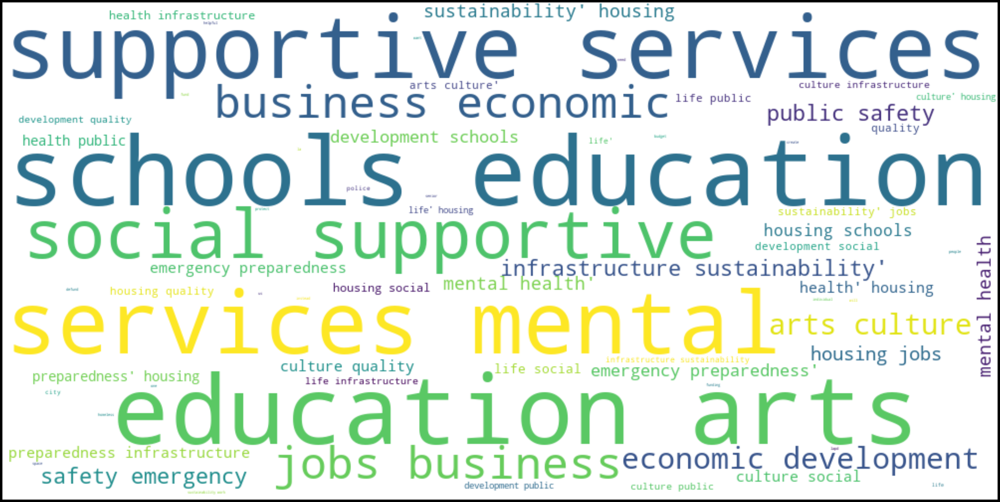

In [37]:
get_word_cloud(df.iloc[:,14].values)

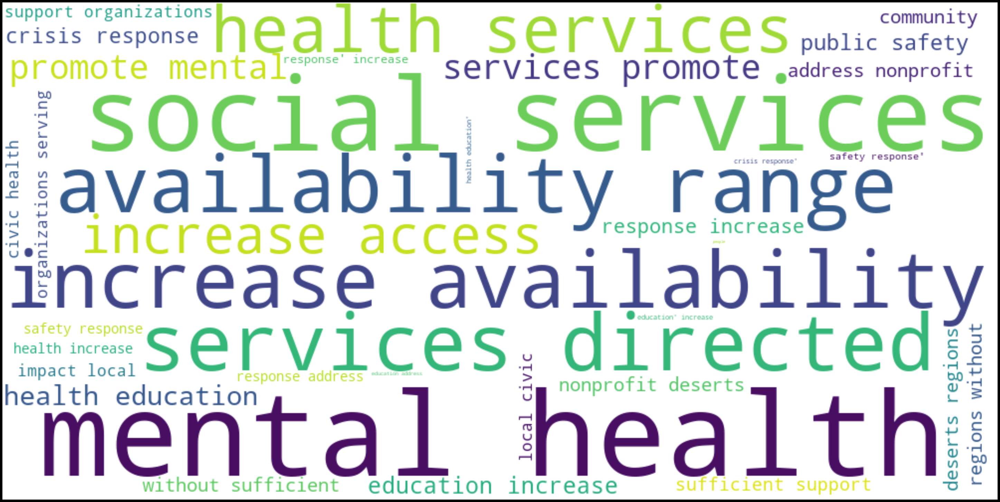

In [38]:
get_word_cloud(df.iloc[:,11].values)

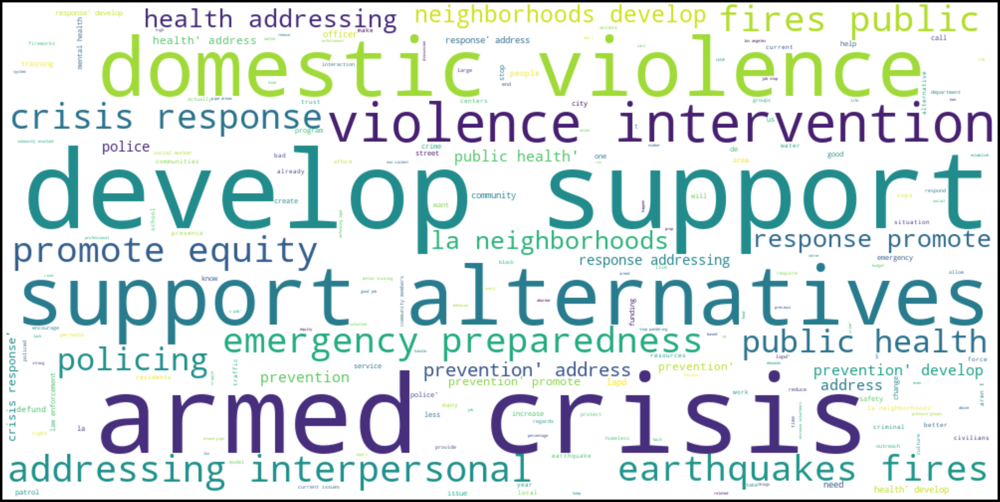

In [39]:
get_word_cloud(df.iloc[:,12].values)

## Count Vectorizer <a id="1.6_Count_Vectorizer"></a>

The purpose of Ngrams is to display any patterns between the word groupings that can identify main ideas regarding the text. Can be used for spelling correction, text summarization, and tokenizing  
Returns the frequency of words  

In [40]:
from sklearn.feature_extraction.text import CountVectorizer

**unigrams from vectorized data**

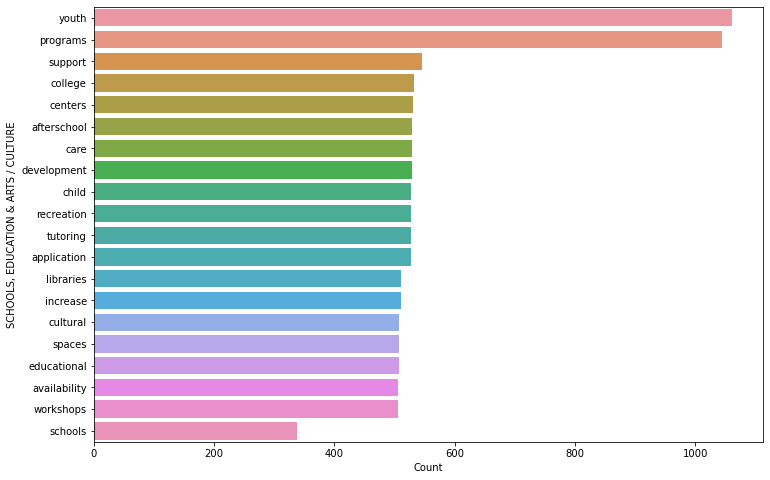

In [41]:
# the base ngram is a unigram and it returns the frequency for each word in a document
word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer= "word", stop_words='english')
sparse_matrix= word_vectorizer.fit_transform(df.iloc[:,9])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", ylabel=df.columns[9])
plt.show()

**Bigrams from vectorized data**

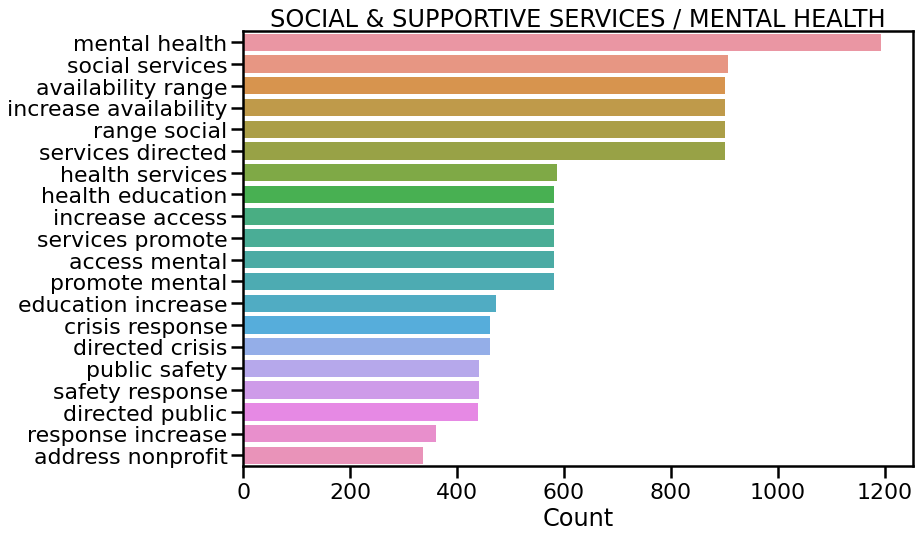

In [42]:
word_vectorizer = CountVectorizer(ngram_range=(2,2), analyzer= "word", stop_words="english")
sparse_matrix= word_vectorizer.fit_transform(df.iloc[:,11])
freq = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
word = word.nlargest(columns = "frequency", n=20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y=word.index, x='frequency')
sns.set_context("poster")
ax.set(xlabel="Count", title=df.columns[11])
plt.show()
##  plt.savefig('books_read.png')

In [43]:
def count_vec(corpus, x=2, y=2):
    """
    parameters: text corpus, in our case all the responses to a column(question)
    returns: bar plot of bigrams (pairs of words) that appear most frequent
    ngrams explained: https://kavita-ganesan.com/what-are-n-grams/
    
    """
    word_vectorizer = CountVectorizer(ngram_range=(x,y), analyzer= "word", stop_words="english")
    sparse_matrix= word_vectorizer.fit_transform(corpus)
    freq = sum(sparse_matrix).toarray()[0]
    word = pd.DataFrame(freq, index=word_vectorizer.get_feature_names(), columns= ['frequency'])
    word = word.nlargest(columns = "frequency", n=20)
    plt.figure(figsize=(12,8))
    ax = sns.barplot(data = word, y=word.index, x='frequency')
    sns.set_context("poster")
    ax.set(xlabel="Count")
    print(corpus.name)
    plt.show()

Please share any other general comments, support or guidance that you might like to provide. 


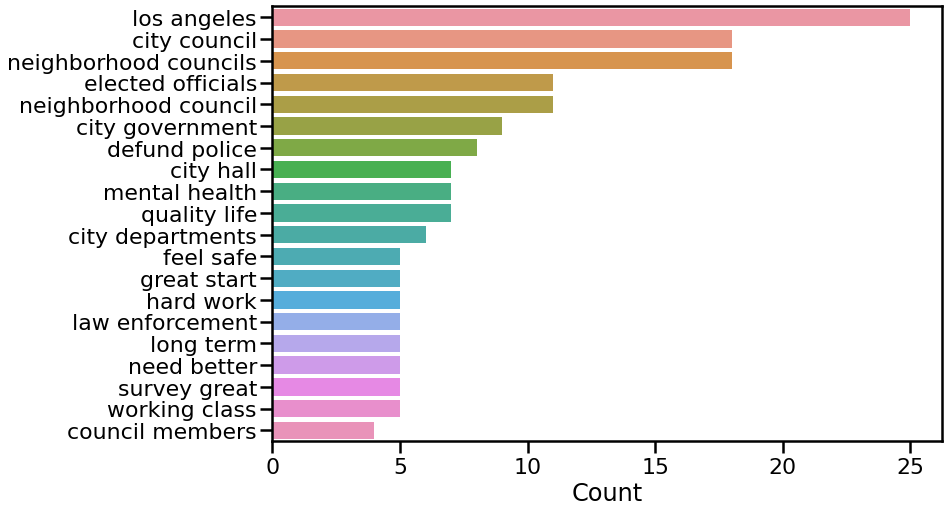

In [44]:
count_vec(df.iloc[:,19])

## TF-IDF Vectorizer<a id="TF_-_IDF_Vectorizer"></a>

**Purpose**: extract features from text  
machines can only work with numerical values  
  
**Term Frequency * Inverse Document Frequency** 
  
* Term Frequency: number of times a word, w appears in a document, d 
* Document Frequency: number of documents where the term appears in  


**Simple Explanation/Example for TF-IDF**  

sent1: good day  
sent2: good night   
sent3: day night good   

TF = $$ (number of repetition of words in a sentence) / (# of words in a sentence) $$  
IDF = $$ log((# of sentences)/(# of sentences containing words)) $$  

**Term Frequency**  
  
Words | Sent1 | Sent2 | Sent3 |
:-------------------|:---------------|:--------------------:|--------------------:|
**good**       | $$ 1/2 $$   | $$ 1/2 $$ | $$ 1/3 $$
**day**        | $$ 1/2 $$   | $$ 0 $$   | $$ 1/3 $$
**night**      | $$ 0 $$     | $$ 1/2 $$ | $$ 1/3 $$ 
  
$$ * $$  

**Inverse Document Frequency** 
  
  
Words | IDF
:-------------------|--------------------:
**good**       |  $$ log(3/3) = 0 $$
**day**        |  $$ log(3/2) $$
**night**      |  $$ log(3/2) $$
  
$$ = $$  
  
    
sentences | good | day | night |     
:-------------------|:---------------|:--------------------:|--------------------:|
**sent1**       | $$ 0 $$  |  $$ 1/2 * log(3/2) $$ | $$ 0 $$ |
**sent2**       | $$ 0 $$  | $$ 0  $$              | $$ 1/2 * log(3/2) $$   
**sent3**       | $$ 0 $$  |  $$ 1/3 * log(3/2) $$ | $$ 1/3 * log(3/3) $$   
  

We are trying to extract semantic meaning from each sentence, notice how the words 'day' and 'night' have more value than the adjective 'good' from the third sentence. (This is just a base level explanation)    
  
**Resources:**  
* https://scikit-learn.org/stable/modules/feature_extraction.html
* https://www.youtube.com/watch?v=D2V1okCEsiE
* https://www.youtube.com/watch?v=4vT4fzjkGCQ
* https://www.oreilly.com/library/view/applied-text-analysis/9781491963036/ch04.html

In [45]:
from sklearn.feature_extraction.text import TfidfVectorizer
#from sklearn.feature_extraction.text import TfidfTransformer

In [46]:
def create_cloud(docs):
    """
    
    parameters: corpus (all responses for a particular question/topic)
    returns: word clouds based on weights
    
    """
    title = docs.name
    # calculates the weight for each word 
    vectorizer = TfidfVectorizer(analyzer="word",  min_df=0, stop_words='english')
    tfidf_matrix= vectorizer.fit_transform(docs.values)
    feature_names = vectorizer.get_feature_names()
    dense = tfidf_matrix.todense()
    denselist = dense.tolist()
    tfidf_df = pd.DataFrame(denselist, columns=feature_names)
 
    # takes in weights and outputs a wordcloud
    cloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(tfidf_df.T.sum(axis=1))
    fig = plt.figure(
        figsize= (30,20), 
        facecolor = 'k', 
        edgecolor = 'k')
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    print(title) # better for visual purposes
    #plt.title("{}".format(title), color= 'black', backgroundcolor='white', fontweight=50, fontsize=30)
    plt.show()

In [47]:
def get_sorted_weights(docs):
    """
    
    similar to word cloud function, but instead returns a sorted list of weighted values respective to each word
    paramters: corpus, document, sentence
    returns: sorted list of top 15 words with their weights
    
    https://stackoverflow.com/questions/45805493/sorting-tfidfvectorizer-output-by-tf-idf-lowest-to-highest-and-vice-versa
    
    """
    vectorizer = TfidfVectorizer(analyzer="word",  min_df=0, stop_words='english')
    tfidf_matrix= vectorizer.fit_transform(docs.values)

    words = vectorizer.get_feature_names()

    totals = tfidf_matrix.sum(axis=0)

    data = []
    for col, word in enumerate(words):
        data.append( (word, totals[0,col] ))

    ranking = pd.DataFrame(data, columns=['word','rank'])
    print(docs.name)
    print(ranking.sort_values('rank', ascending=False).head(15))

In [48]:
get_sorted_weights(df.iloc[:,14])

Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.
               word        rank
165         housing  115.074458
109       education   98.495039
316         schools   98.180872
80          culture   98.041190
15             arts   97.971203
155          health   93.018117
322        services   92.961896
222          mental   92.812312
346      supportive   92.791816
329          social   92.728202
106        economic   90.666558
88      development   90.666558
185            jobs   90.462901
34         business   90.421380
348  sustainability   90.109304


Of the categories of possible City budget initiatives listed above, which are your top 3? Please select them from this list.


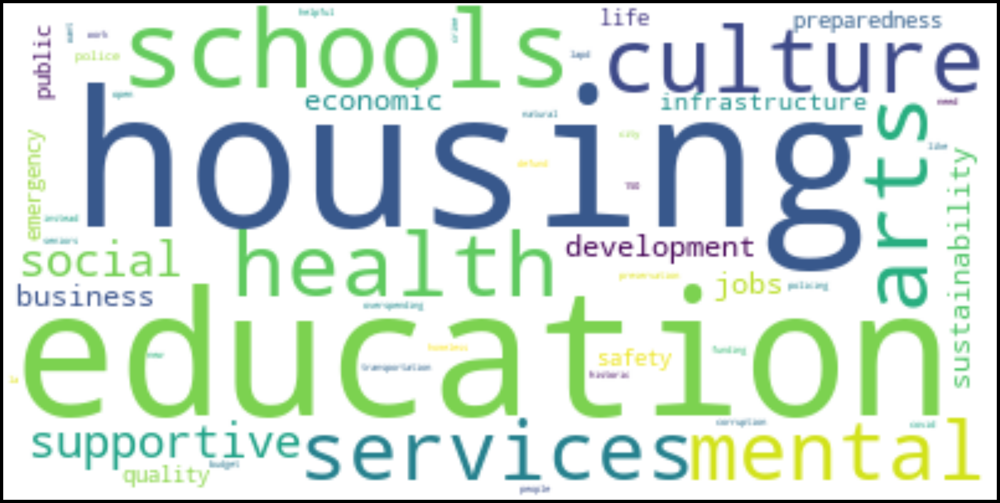

In [49]:
create_cloud(df.iloc[:,14])

INFRASTRUCTURE & SUSTAINABILITY


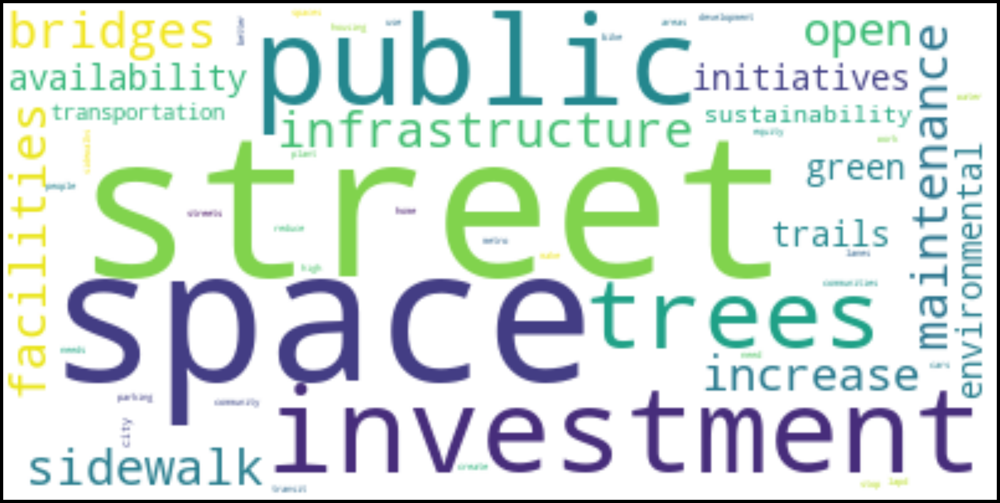

In [50]:
create_cloud(df.iloc[:,13])

PUBLIC SAFETY & EMERGENCY PREPAREDNESS


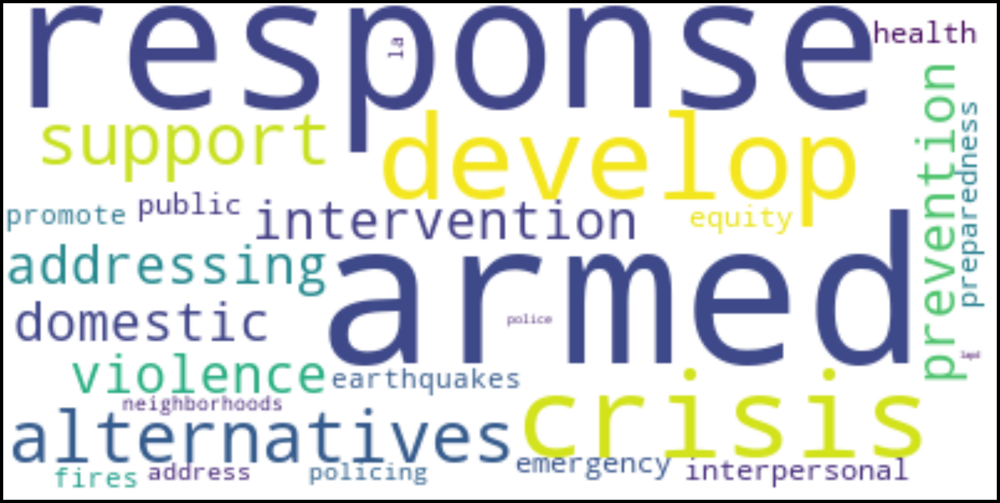

In [51]:
create_cloud(df.iloc[:,12])

How might civic engagement be built into the development of City programs?


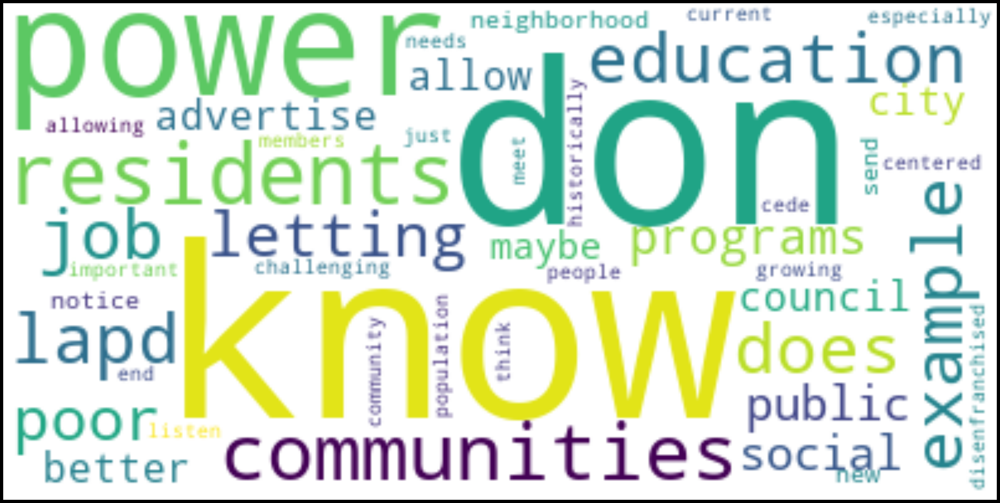

In [52]:
create_cloud(df.iloc[10:15, 18])

SOCIAL & SUPPORTIVE SERVICES / MENTAL HEALTH


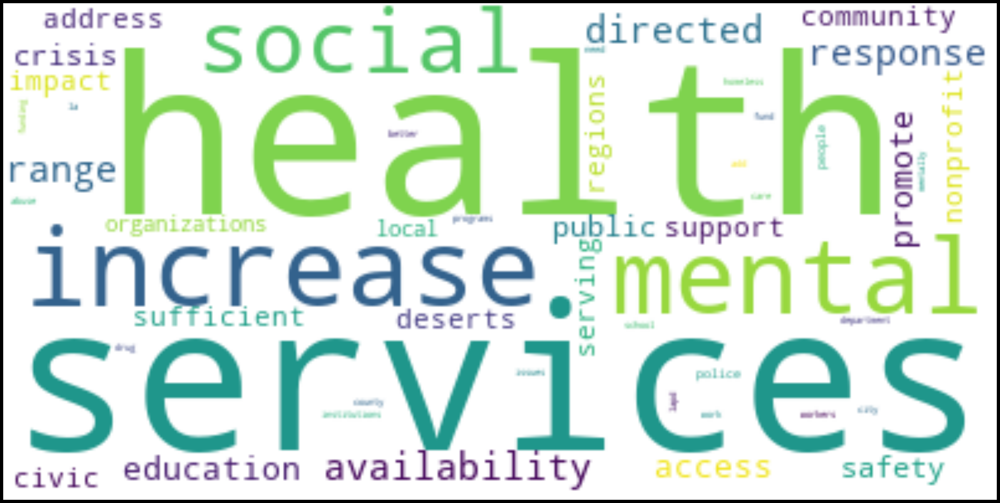

In [53]:
create_cloud(df.iloc[:,11])

What sort of programs, services, or other mechanisms could be deployed to put the initiatives you selected above into action? 


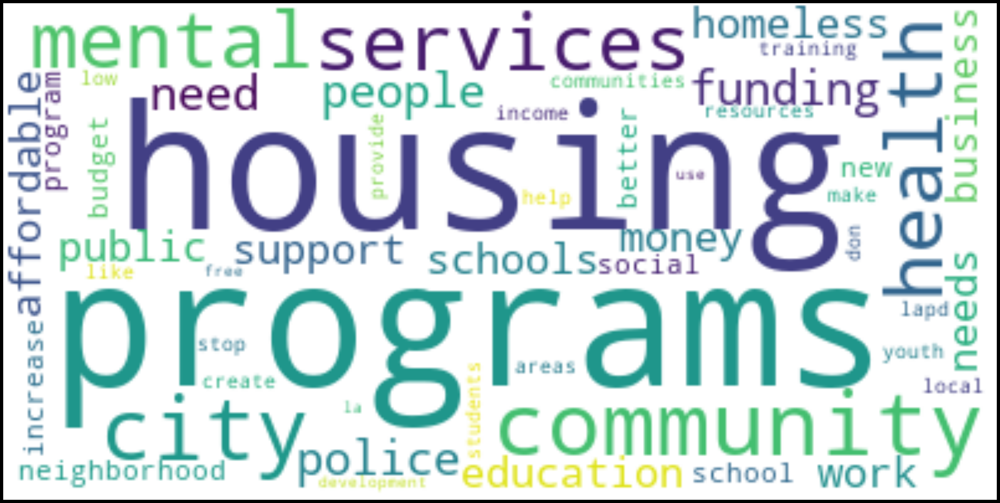

In [54]:
create_cloud(df.iloc[:,16])

## Spacy

In [55]:
import spacy 
import en_core_web_sm
nlp = en_core_web_sm.load()


test = df.iloc[1,6]
doc = nlp(test)

In [56]:
for token in doc: 
    print(token.text)
    
# [token.text for token in doc]  
# list of word tokens

our
communities
have
a
high
level
of
social
and
economic
disparity
issues
.


In [57]:
for word in doc:
    print(word.text, word.pos_, word.tag_)

our PRON PRP$
communities NOUN NNS
have VERB VBP
a DET DT
high ADJ JJ
level NOUN NN
of ADP IN
social ADJ JJ
and CCONJ CC
economic ADJ JJ
disparity NOUN NN
issues NOUN NNS
. PUNCT .


In [58]:
for word in doc.ents:
    print(word.text)

In [59]:
test2 = df.iloc[1][6]
doc2 = nlp(test2)

for word in doc2.ents:
    print(word.text, word.label_)

## NLTK

In [60]:
import nltk 
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag

sample_text = df.iloc[1,6]

In [61]:
def preprocess(sent):
    sent = nltk.word_tokenize(sent)
    sent = nltk.pos_tag(sent)
    return sent

In [62]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [63]:
sample_text = preprocess(sample_text)
sample_text

[('our', 'PRP$'),
 ('communities', 'NNS'),
 ('have', 'VBP'),
 ('a', 'DT'),
 ('high', 'JJ'),
 ('level', 'NN'),
 ('of', 'IN'),
 ('social', 'JJ'),
 ('and', 'CC'),
 ('economic', 'JJ'),
 ('disparity', 'NN'),
 ('issues', 'NNS'),
 ('.', '.')]

In [64]:
# from codecademy 
from nltk.corpus import wordnet
def get_part_of_speech(word):
    part_of_speech = wordnet.synsets(word)
    pos_counts = Counter()
    pos_counts['n'] = len([item for item in part_of_speech if item.pos() == 'n'])
    pos_counts['v'] = len([item for item in part_of_speech if item.pos() == 'v'])
    pos_counts['a'] = len([item for item in part_of_speech if item.pos() == 'a'])
    pos_counts['r'] = len([item for item in part_of_speech if item.pos() == 'r'])
    
    most_likely_part = pos_counts.most_common(1)[0][0]
    return most_likely_part

In [65]:
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import re
from collections import Counter

#from part_of_speech import get_part_of_speech

nltk.download('stopwords')
nltk.download('wordnet')
text = data.iloc[55,10]

cleaned = re.sub("\W+", ' ', text).lower()
tokenized = word_tokenize(cleaned)

stop_words = stopwords.words('english')
filtered  = [word for word in tokenized if word not in stop_words]

normalizer = WordNetLemmatizer()
normalized = [normalizer.lemmatize(token, get_part_of_speech(token)) for token in filtered]

bag_of_words = Counter(normalized)
print(bag_of_words)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/sathwikthecreator/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Counter({'increase': 1, 'support': 1, 'family': 1, 'food': 1, 'health': 1, 'service': 1, 'recreation': 1, 'wellness': 1, 'program': 1})


In [66]:
# Language Models: N-Gram using NLTK
from nltk.util import ngrams 

looking_bigrams = ngrams(tokenized, 2)
looking_bigrams_freq = Counter(looking_bigrams)

looking_trigrams = ngrams(tokenized, 3)
looking_trigrams_freq = Counter(looking_trigrams)

print(looking_bigrams_freq.most_common(3))
print(looking_trigrams_freq.most_common(3))

[(('increased', 'support'), 1), (('support', 'for'), 1), (('for', 'families'), 1)]
[(('increased', 'support', 'for'), 1), (('support', 'for', 'families'), 1), (('for', 'families', 'with'), 1)]


In [67]:
def pre_process(text):
    cleaned = re.sub(r'\W+', ' ',text).lower()
    tokenized = word_tokenize(cleaned)
    normalized = [normalizer.lemmatize(token, get_part_part_of_speech(token)) for token in tokenized]
    filtered = [word for word in normalized if word not in stop_words]
    return " ".join(filtered)